(140, 157, 3)


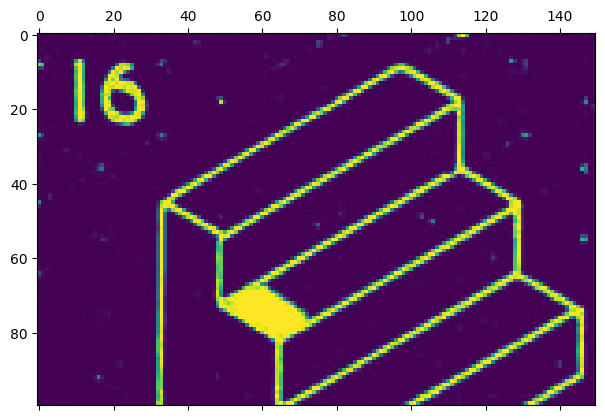

In [237]:
import numpy as np

from skimage.transform import hough_line, hough_line_peaks
from skimage.feature import canny
from skimage.draw import line as draw_line
from skimage import data
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.transform import probabilistic_hough_line
import random 

# Load image"
# image_path = "/Users/nshelton/Pictures/gundam_title.png"
# image_path = "/Users/nshelton/Pictures/akira.jpeg"
# image_path = "/Users/nshelton/Pictures/amplifier_schematic.png"
image_path = "/Users/nshelton/Pictures/stairs.png"

image = cv2.imread(image_path)
print(image.shape)

# image[:,:,1] = image[:,:,0]
# image[:,:,2] = image[:,:,0]

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# image_gray = cv2.resize(image_gray, (-1,-1), fx = 2, fy = 2)
# _ , filtered =  cv2.threshold(image_gray, 150, 505, cv2.THRESH_BINARY_INV)

filtered = image_gray


# sigma = 2
# min_canny = 2
# max_canny = 100
# filtered = canny(image_gray, sigma, min_canny, max_canny).astype(np.uint8) * 255

filtered = 255 - filtered

filtered = filtered[0:100, 0:150]

# filtered = filtered[950:1000, 1150:1200]
cv2.imwrite("filtered.png", filtered)



plt.matshow(filtered)


In [238]:

erode_stack = filtered.copy()
erode_stack = cv2.blur(erode_stack, (3,3))

# plt.matshow(erode_stack, cmap="turbo")

erode_stack = cv2.adaptiveThreshold(erode_stack, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  cv2.THRESH_BINARY, 201, -10)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

distance_field = []
for i in range(10) : 
    erode_stack = cv2.erode(erode_stack, kernel)
    distance_field.append(erode_stack)

distance_field =  (np.array(distance_field) > 0).sum(axis=0).astype(np.float32)

# plt.matshow(distance_field, cmap="turbo")

scale = 1
delta = 0
ddepth = cv2.CV_16S

grad_x = cv2.Sobel(distance_field, ddepth, 1, 0, ksize=1, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT).astype(np.float32)
grad_y = cv2.Sobel(distance_field, ddepth, 0, 1, ksize=1, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT).astype(np.float32)




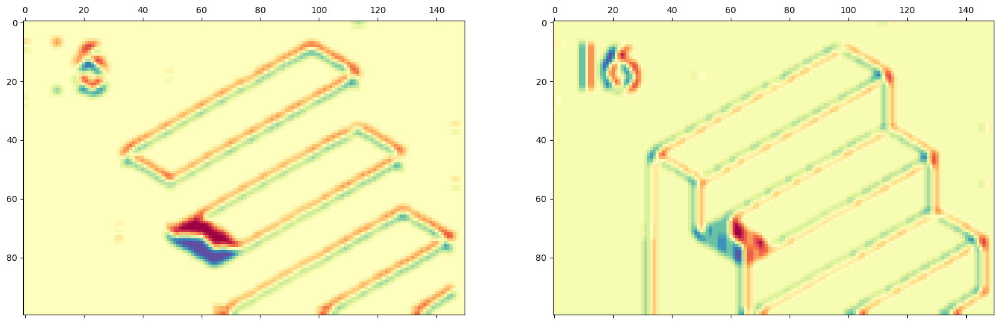

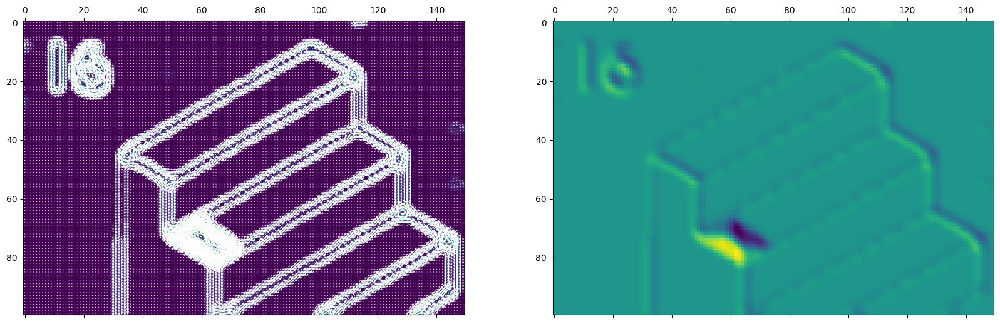

In [247]:

flow_field = np.dstack([-grad_y, grad_x])
flow_field = cv2.blur(flow_field, (3,3))
# flow_field = cv2.blur(flow_field, (3,3))
# flow_field = cv2.blur(flow_field, (3,3))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.matshow(flow_field[:,:,0], cmap="Spectral")
ax2.matshow(flow_field[:,:,1],  cmap="Spectral")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

X, Y = np.meshgrid(range(grad_x.shape[1]), range(grad_x.shape[0]))


mag = np.linalg.norm(flow_field, axis = 2)
angles = np.arctan2(flow_field[:,:,0], flow_field[:,:,1])

angles = angles + np.pi/2

flow_field[:,:,0] = np.cos(angles) * mag
flow_field[:,:,1] = np.sin(angles) * mag
flow_field = cv2.blur(flow_field, (3,3))

ax1.matshow(mag)
ax1.quiver(X,Y, flow_field[:,:,0], flow_field[:,:,1], color="white", pivot="mid", width = 0.002, scale = 100)


curl = (flow_field[:,:,1] - flow_field[:,:,0])

ax2.matshow(curl)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


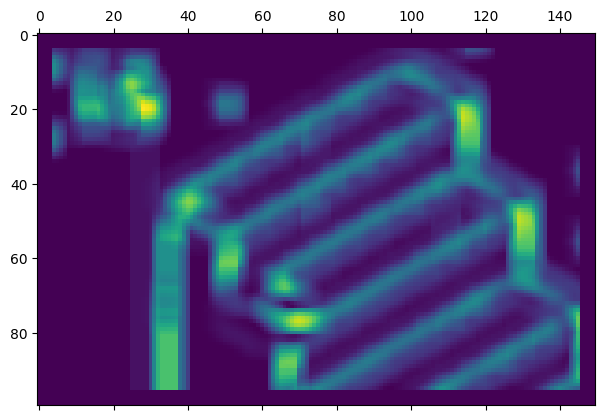

In [246]:
variance = np.zeros((flow_field.shape[0], flow_field.shape[1]))
window = 4
for row in range(window, flow_field.shape[0]-window):
    for col in range(window, flow_field.shape[1]-window):
        flow_window = flow_field[row-window:row+window, col-window:col+window, :]
        angles = np.arctan2(flow_window[:,:,0], flow_window[:,:,1])
        variance[row, col] = np.var(angles)

print(variance)
plt.matshow(variance)


86028
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


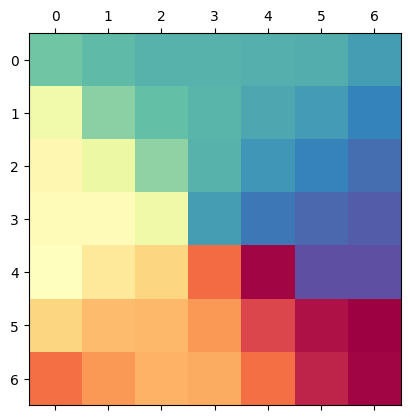

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


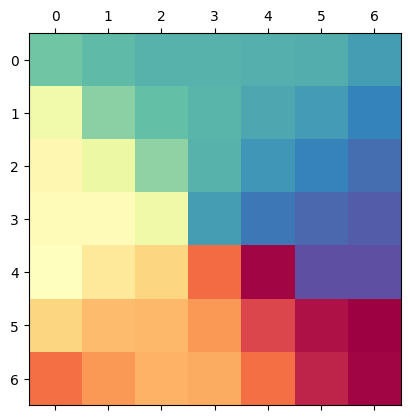

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


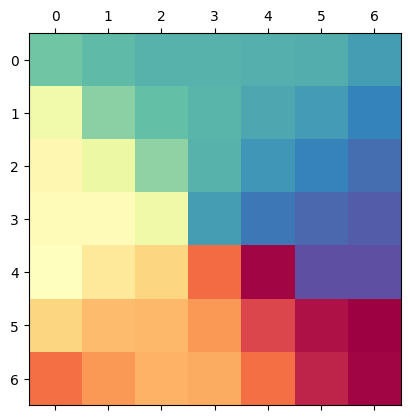

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


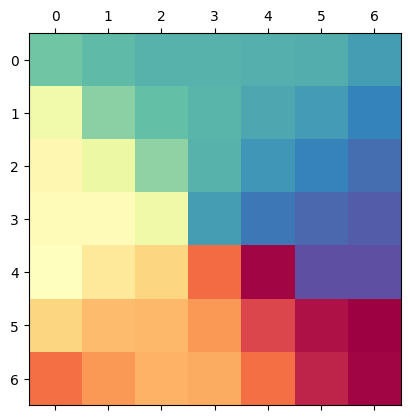

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


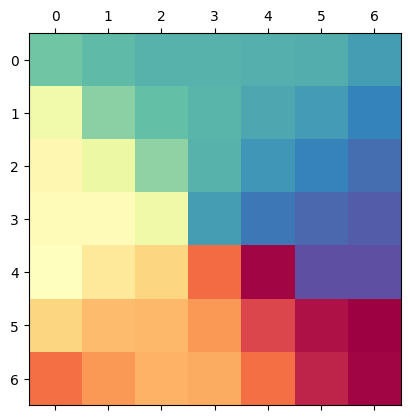

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


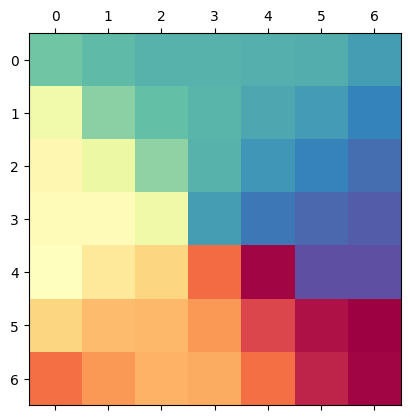

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


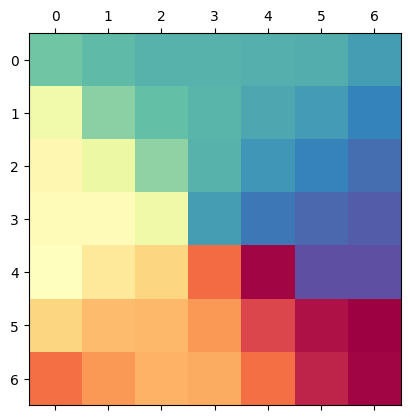

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


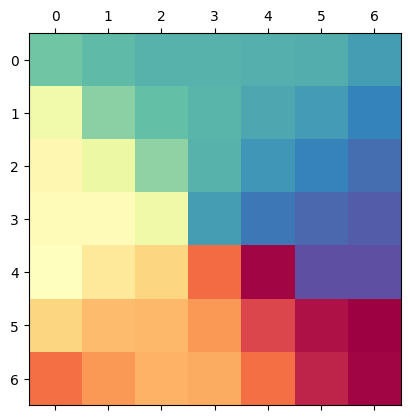

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


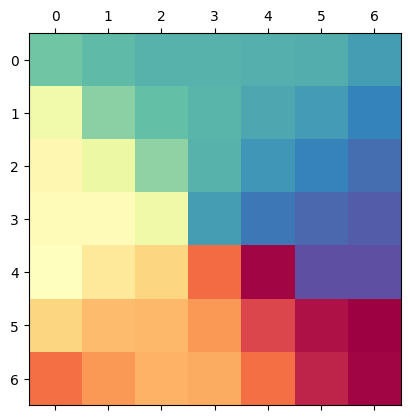

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


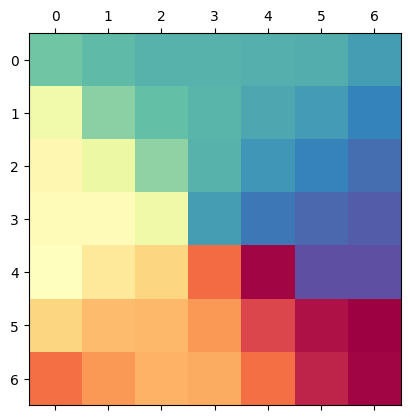

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


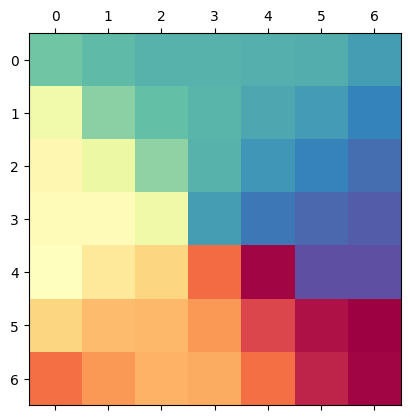

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


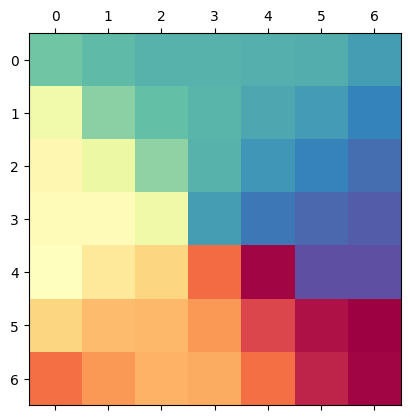

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


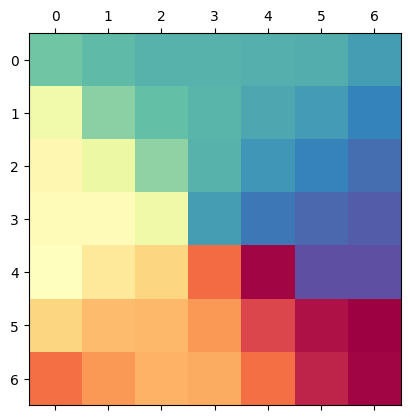

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


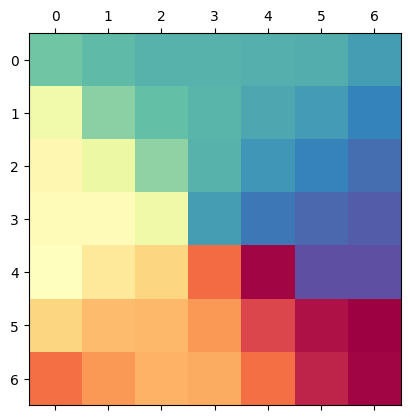

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


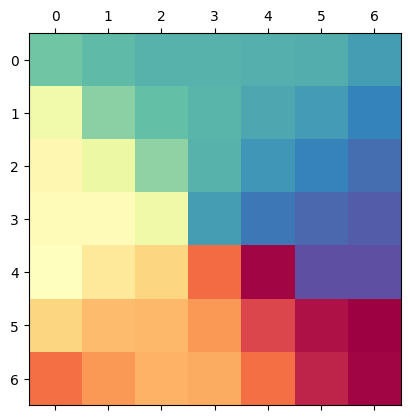

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


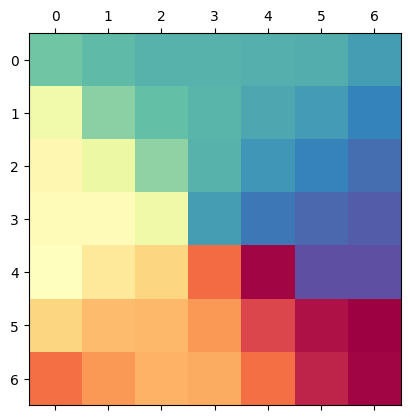

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


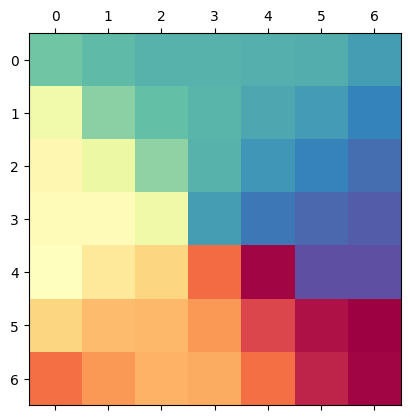

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


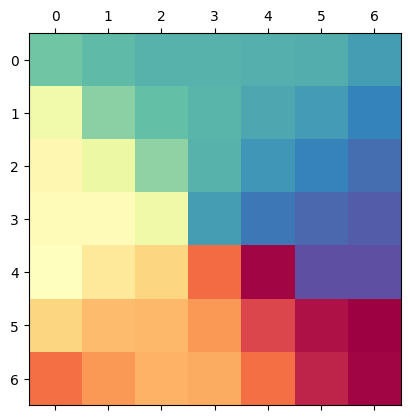

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


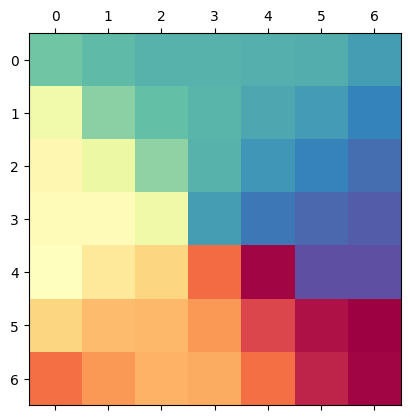

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


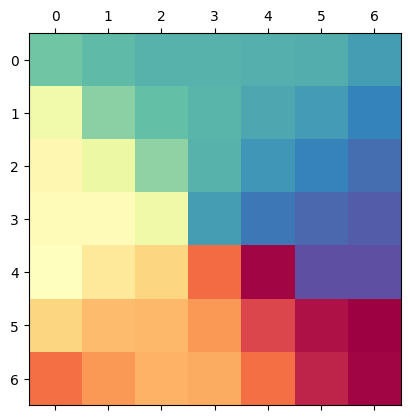

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


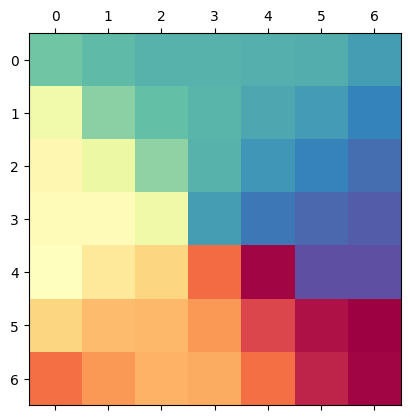

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


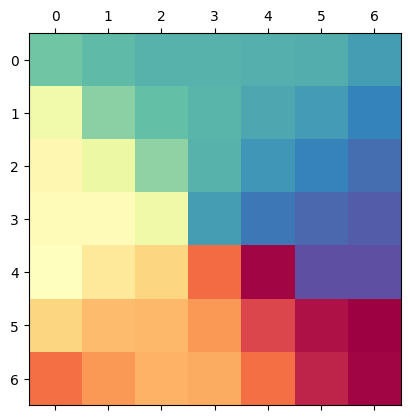

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


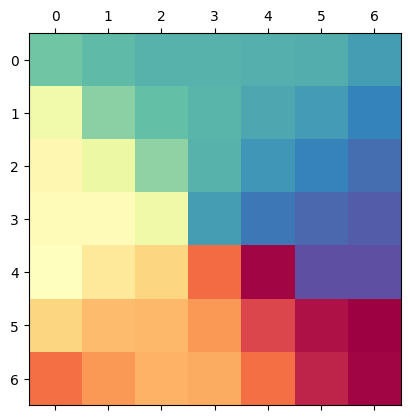

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


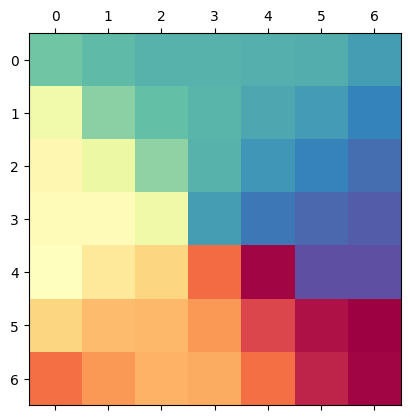

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


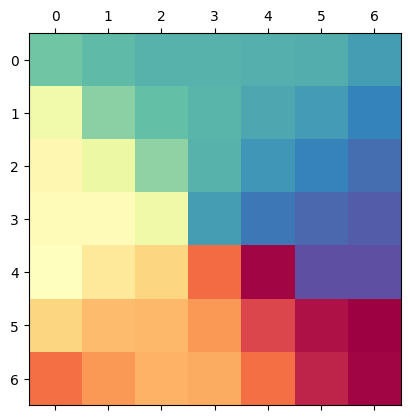

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


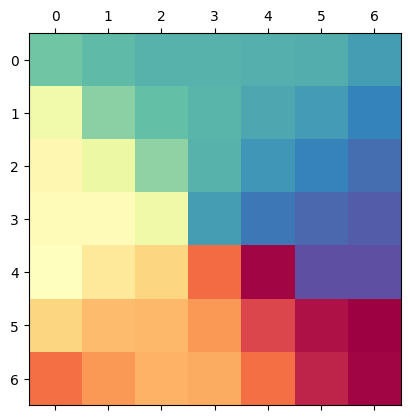

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


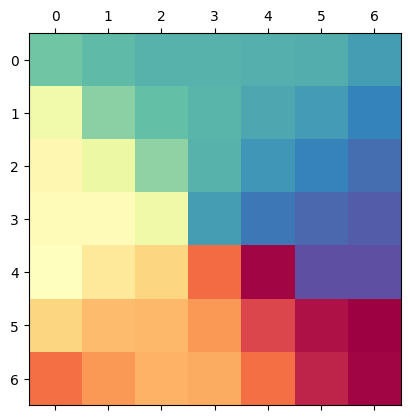

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


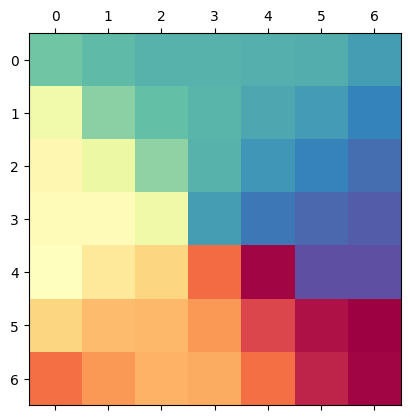

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


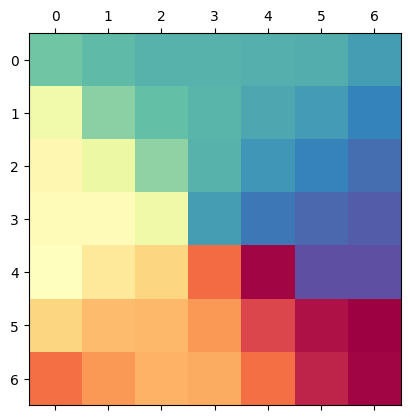

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


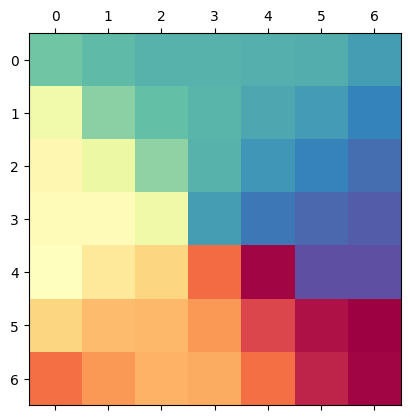

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


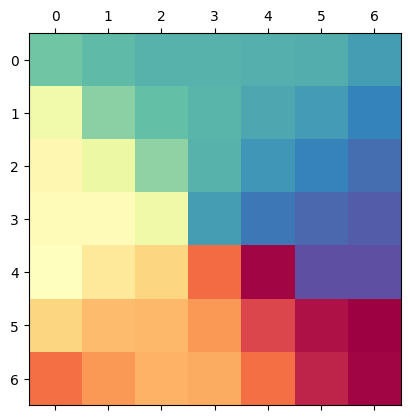

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


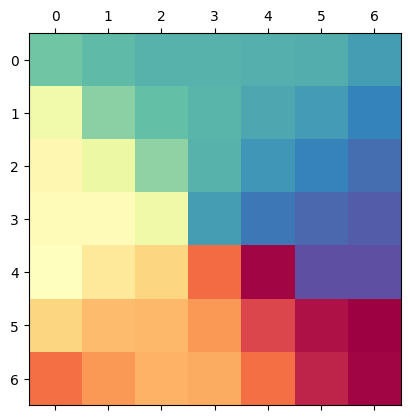

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


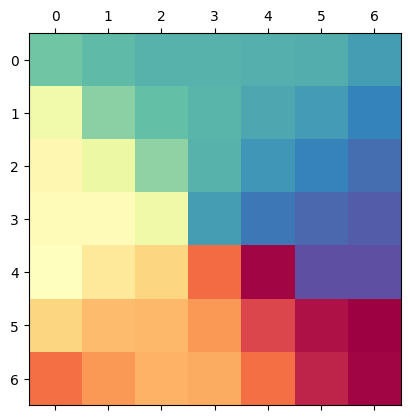

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


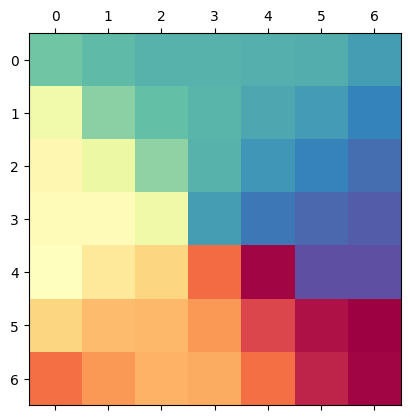

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


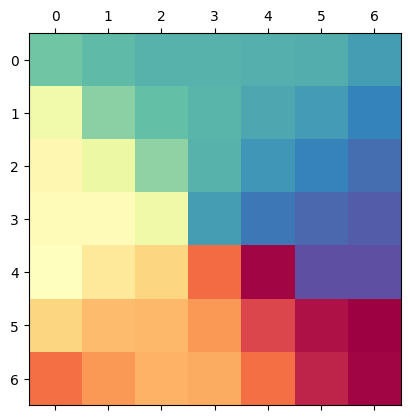

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


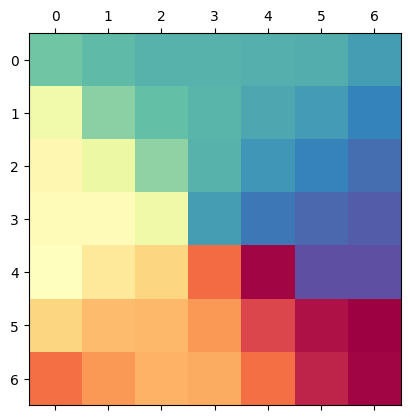

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


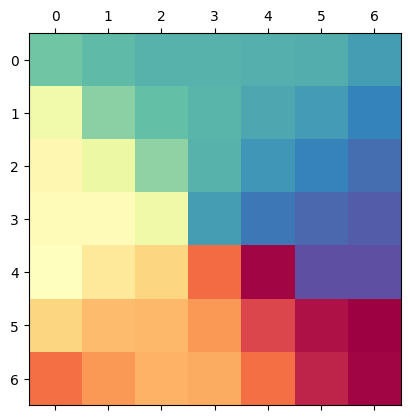

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


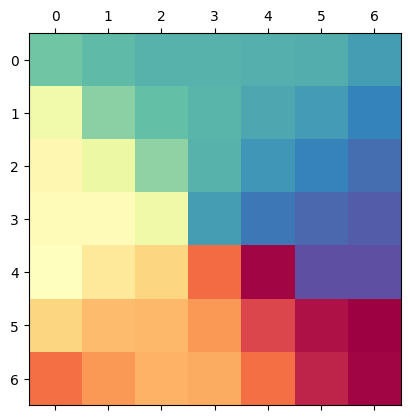

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


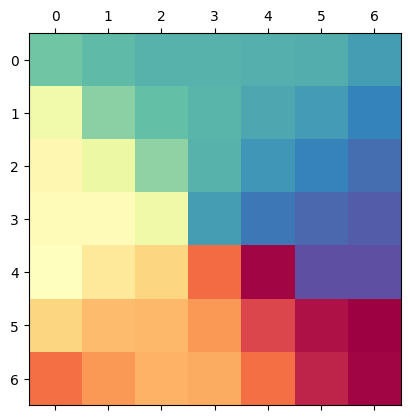

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


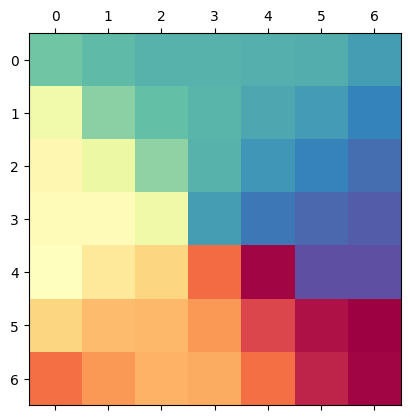

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


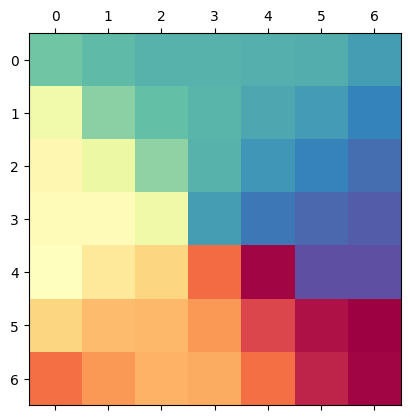

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


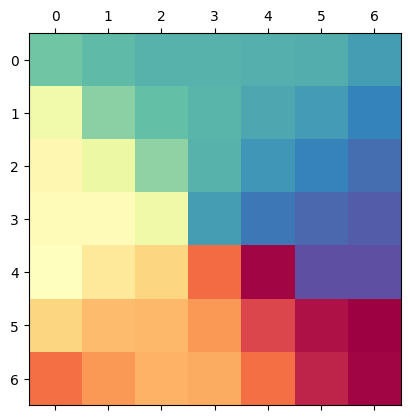

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


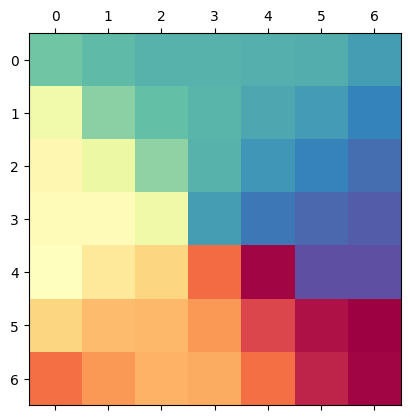

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


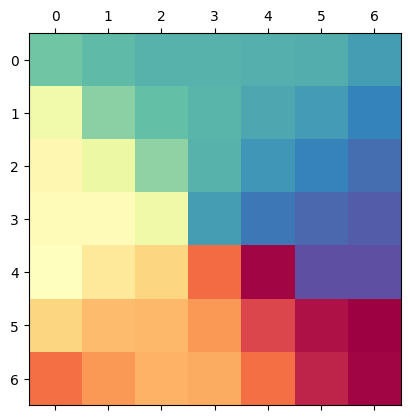

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


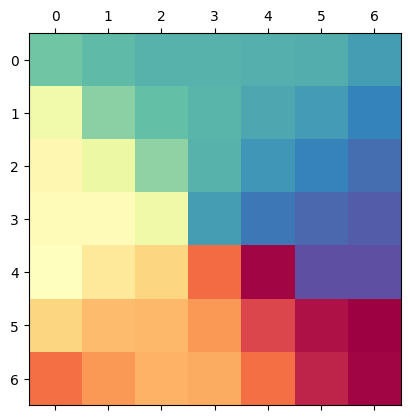

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


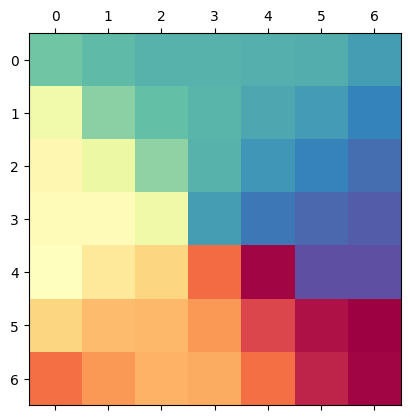

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


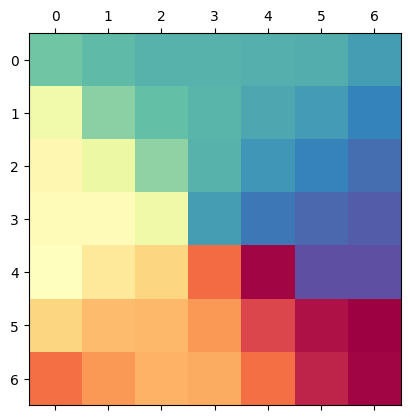

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


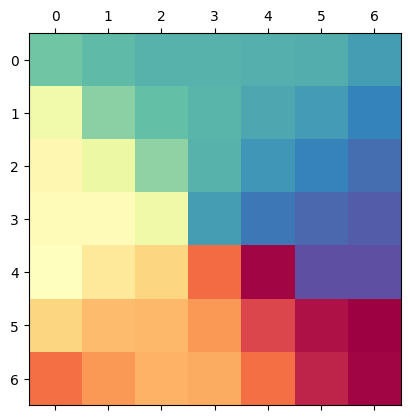

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


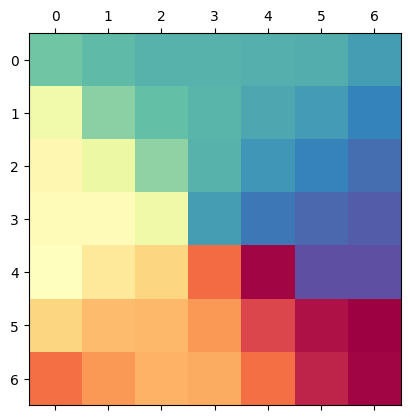

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


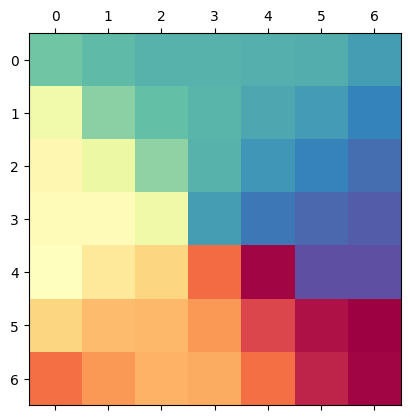

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


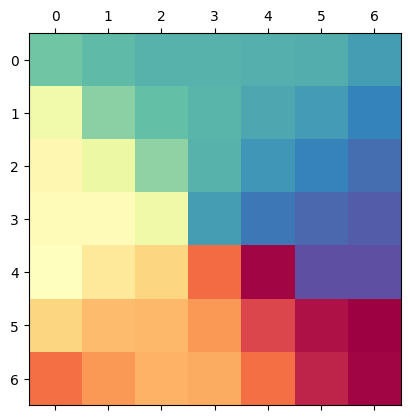

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


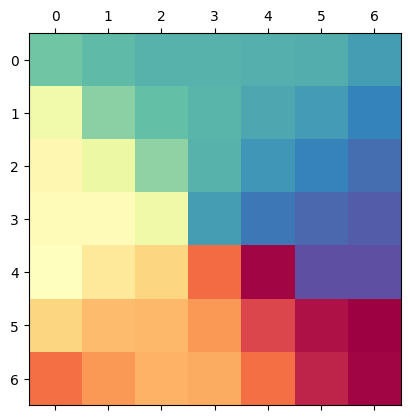

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


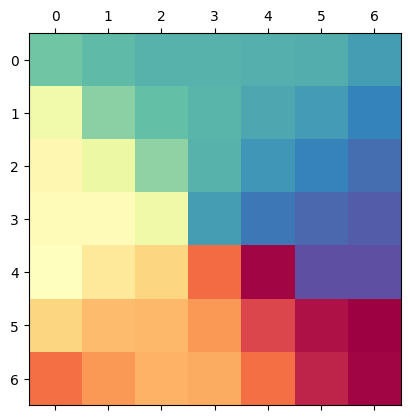

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


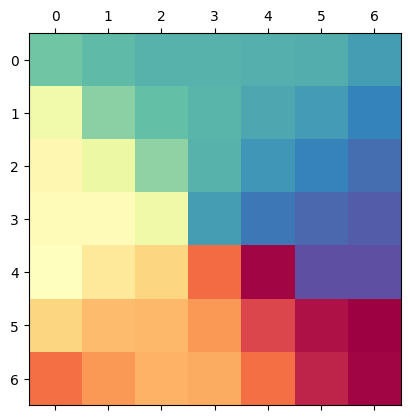

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


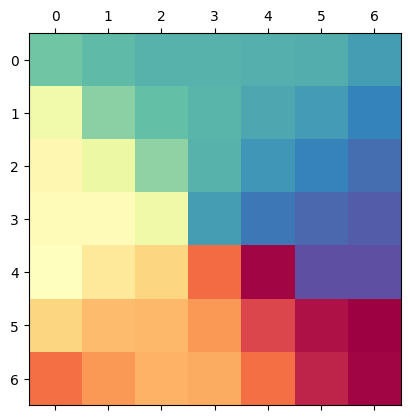

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


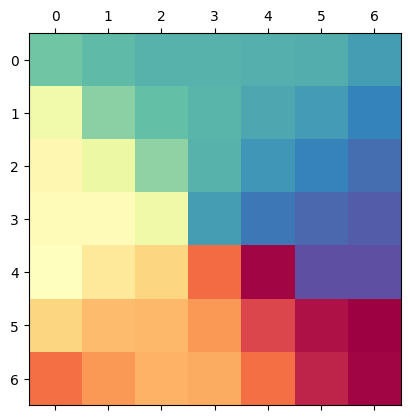

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


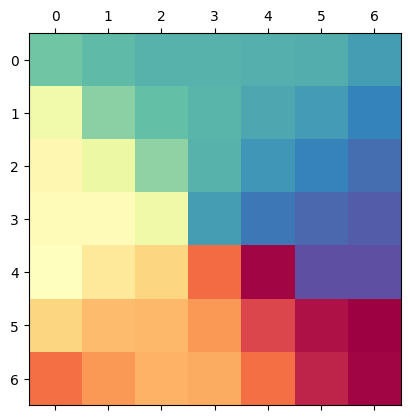

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


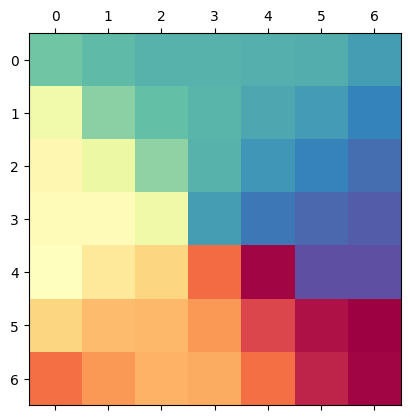

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


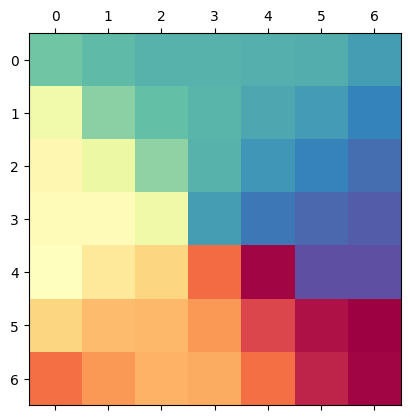

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


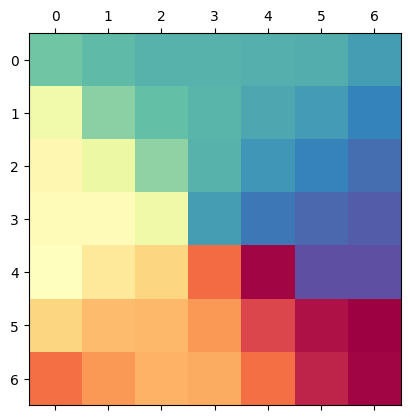

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


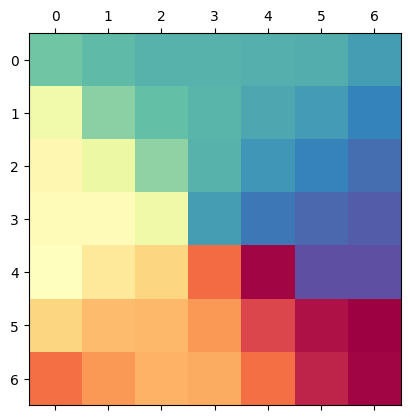

flow [ 0.38 -0.3 ] @ [44. 24.]
[44.79 23.39] 198
start [44. 24.]
[44. 24.] 255
[[ 1.76  1.93  2.01  2.02  2.05  2.06  2.25]
 [ 0.31  1.51  1.86  2.01  2.14  2.27  2.5 ]
 [-0.17  0.41  1.46  2.02  2.31  2.52  2.74]
 [-0.07 -0.07  0.34  2.23  2.65  2.81  2.93]
 [-0.   -0.46 -0.74 -1.88 -3.05  3.1   3.07]
 [-0.74 -1.07 -1.11 -1.45 -2.38 -2.94 -3.11]
 [-1.84 -1.46 -1.19 -1.25 -1.85 -2.74 -3.06]]


KeyboardInterrupt: 

In [227]:
from pathUtils import *

np.set_printoptions(suppress=True, precision = 2)

def rasterStroke(dims, path, line_thickness):
        img = np.zeros(dims, np.uint8)
        if (len(path)) == 1:
            cv2.circle(
                img, (round(path[0][0]), round(path[0][1])), line_thickness, 1, -1
            )
        for i in range(len(path) - 1):
            a = (round(path[i][0]), round(path[i][1]))
            b = (round(path[i + 1][0]), round(path[i + 1][1]))
            cv2.line(img, a, b, 1, line_thickness, cv2.LINE_AA)
        return img

def lookupxy(raster, xy):
    if int(xy[1]) >= 0 and int(xy[1]) < raster.shape[0] and int(xy[0]) >= 0 and int(xy[0]) < raster.shape[1]:
        return raster[int(xy[1]), int(xy[0])]
    return np.nan

def maxLoc(img):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(img)
    return max_loc

def place_path(raster, pos, thickness = 1) : 
    Greedy = False
    print("start", pos)
        
    img = raster.copy()
    path = []
    window = thickness
    circleSize = thickness

    avg_val = lookupxy(img, pos)

    flow =  lookupxy(flow_field, pos)
    flow_angle = np.arctan2(flow[0], flow[1])
    avg_angle = flow_angle
    # avg_angle = np.nan
    while len(path) < 1000:
        val = lookupxy(img, pos)
        print(pos, val)

        
        if int(pos[1]) < 0 or int(pos[1]) >= img.shape[0] or int(pos[0]) < 0 or int(pos[0]) >= img.shape[1]: break

        if val < 0.8 * avg_val :break

        avg_val = 0.9 * avg_val + 0.1 * val
        path.append(pos.copy())

        if Greedy:
            cv2.circle(img, pos.astype(np.int32), int(circleSize), 0, -1 )
        

        if(Greedy) :
            max_loc = maxLoc(
                img[
                    int(pos[1]) - window : int(pos[1]) + window + 1,
                    int(pos[0]) - window : int(pos[0]) + window + 1,
                ]
            )

            delta = np.array(max_loc) - window

        else :
            flow =  lookupxy(flow_field, pos)
            flow_window = flow_field[
                int(pos[1]) - window : int(pos[1]) + window + 1,
                int(pos[0]) - window : int(pos[0]) + window + 1,
            ]

            # plt.matshow(np.linalg.norm(flow_window, axis = 2))
            print(np.arctan2(flow_window[:,:,0], flow_window[:,:,1]))
            plt.matshow(np.arctan2(flow_window[:,:,0], flow_window[:,:,1]), cmap="Spectral")
            plt.show()

            print("flow", flow, "@", pos)
            if np.linalg.norm(flow) < 0.1:
                print("no flow")
                continue
            delta = flow / np.linalg.norm(flow)


        angle = np.arctan2(delta[0], delta[1])

        if avg_angle == np.nan:
            avg_angle = angle

        avg_angle = avg_angle * 0.5 + angle * 0.5

        if (abs(angle - avg_angle) > np.pi / 6):
            break

        pos += delta

    return path


img = filtered.copy()

# img = img[500:1000, :500]
img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  cv2.THRESH_BINARY, 201, -70)
img = cv2.blur(img, (3,3))
cv2.imwrite("filtered.png", img)

paths = []
print(img.sum())

# while img.sum() > 100:
for i in range(100):
    print(img.sum(), "\t", len(paths), end="\t\t\t\r")

    pos = np.array(maxLoc(img), np.float32)
    path = place_path(img, pos, thickness=3)

    if len(path) < 2:
        continue
    paths.append(path)

    this_stroke = rasterStroke(img.shape, path, line_thickness = 4)
    img = np.clip(img.astype(np.float32) - this_stroke.astype(np.float32) * 255, 0, 255).astype(np.uint8)
    
    cv2.imwrite("remaining_ink.png", img)

print(paths)
path_list = [[p for p in path] for path in paths if len(path) > 1]
RENDER_SCALE = 0.5
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)



In [152]:


from tqdm import tqdm 
path_list = [[p for p in path] for path in paths if len(path) > 1]

print(len(paths))
print(len(path_list))

merge_threshold = 2

for i in tqdm(range(len(path_list))):
    len_before = len(path_list)
    path_list = merge_one_path_kd(path_list, merge_threshold)
    if len_before == len(path_list):
        break

def getPathLength(path):
    length = 0
    for i in range(len(path) - 1):
        length += np.linalg.norm(path[i] - path[i+1])
    return length

path_list = close_loops(path_list, threshold=5)
path_list  = [np.array(path) for path in path_list]

path_list = [path for path in path_list if getPathLength(path) > 2]
path_list = smooth_all_2(path_list, 0.01)
path_list = simplify_all(path_list, 0.001)
path_list = smooth_all_2(path_list, 0.1)
path_list = simplify_all(path_list, 0.1)

RENDER_SCALE = 0.5
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)

8
8


  0%|          | 0/8 [00:00<?, ?it/s]


True

In [5]:
path_list = smooth_all_2(path_list, 0.1)
RENDER_SCALE = 0.5
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)

True

In [6]:
import json
import uuid

projects_folder = "/Users/nshelton/Hephaestus/projects"

def writePlot(paths):
    dictionary = {
        "created_time": "4/7/2024 4:42:27 PM",
        "modified_time": "4/7/2024 6:27:36 PM",
        "camera_position": [100, 100],
        "zoom": 10.702,
        "aspect": 0.563,
        "dom_element": {},
        "plot_models": [],
    }

    dictionary["plot_models"].append(
        {
            "position": {"x": 0, "y": 0},
            "paths": [path.tolist() for path in path_list],
            "scale": 0.1,
            "id": str(uuid.uuid4()),
            "state": "none",
        }
    )


    with open(projects_folder + "/circuit2.json", "w") as outfile:
        json.dump(dictionary, outfile)

writePlot(path_list)


In [7]:
# def lookupxy(raster, xy):
#     if int(xy[1]) > 0 and int(xy[1]) < raster.shape[0] and  int(xy[0]) > 0 and int(xy[0]) < raster.shape[1]:
#         return raster[int(xy[1]), int(xy[0])]
#     return np.nan

# from pathUtils import * 

# from scipy.spatial import KDTree

# points.shape

# paths = []
# visited = np.zeros(values.shape)

# start_idx = int(random.random()* 1000)
# print(start_idx, values[start_idx], points[start_idx])

# path = []
# current_idx = start_idx

# for i in range(1000):
#     tree = KDTree(points[visited == 0])
#     pos = points[current_idx]
#     path.append(pos)
#     visited[current_idx] = 1

#     flow = lookupxy(flow_field, pos)
#     magnitude = np.linalg.norm(flow)
#     print(pos, flow)
#     if (np.isnan(magnitude)):
#         break

#     query_point = pos + flow
#     distance, idx = tree.query(query_point, k=2)

#     if (distance[1] > 10) : 
#         break

#     current_idx = idx[1]

# print(len (path))
# paths.append(path)

# path_render = plotPaths(paths, 1)
# cv2.imwrite("render.png", path_render )

In [8]:
import cv2
import numpy as np

from pathUtils import *

remaining_ink = filtered.copy()
all_strokes_raster = np.ones(remaining_ink.shape) * 255

all_paths = []

while len(all_paths) < 500 and remaining_ink.sum() > 10:

    def lookupxy(raster, xy):
        if int(xy[1]) > 0 and int(xy[1]) < raster.shape[0] and  int(xy[0]) > 0 and int(xy[0]) < raster.shape[1]:
            return raster[int(xy[1]), int(xy[0])]
        return np.nan


    def placeStroke(input_raster, start):
        img = input_raster.copy()
        path = []
        pos = np.array(start)

        window = 2

        max_val = lookupxy(input_raster, pos)

        while max_val > 0:
            min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(
                img[
                    pos[1] - window : pos[1] + window + 1,
                    pos[0] - window : pos[0] + window + 1,
                ]
            )
            pos += np.array(max_loc) - window
            path.append(pos.copy())
            cv2.circle(img, pos, window - 1, 0, -1)

        return path

    def placeStrokeOrthogonalGradient(input_raster, flow_field, start):
        img = input_raster.copy()
        path = []
        pos = np.array(start, np.float32)
        print("start at", pos, lookupxy(img, pos))

        speed = 2
        while (
            int(pos[0]) < img.shape[1] and int(pos[1]) < img.shape[0]
            and lookupxy(img, pos) > 0
        ):
            path.append(pos.copy())
            cv2.circle(img, (round(pos[1]), round(pos[0])), speed , 0, -1)

            flow = lookupxy(flow_field, pos)
            magnitude = np.linalg.norm(flow)
            print("flow", flow, magnitude, pos)
            if magnitude < 0.001:
                break

            delta = speed * flow / magnitude
            print("delta", delta)
            pos += delta
            print("newpos ",pos, img.shape, lookupxy(img, pos))

        return path

    line_thickness = 2

    def rasterStroke(dims, path):
        print(len(path))

        img = np.zeros(dims)

        if (len(path)) == 1:
            cv2.circle(
                img, (round(path[0][0]), round(path[0][1])), line_thickness, 255, -1
            )

        for i in range(len(path) - 1):
            a = (round(path[i][0]), round(path[i][1]))
            b = (round(path[i + 1][0]), round(path[i + 1][1]))
            cv2.line(img, a, b, 255, line_thickness, cv2.LINE_AA)

        return img

    print(remaining_ink.sum(), "\t", len(all_paths), end="\t\t\t\r")
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(remaining_ink)

    # new_stroke = placeStroke(remaining_ink, max_loc)
    new_stroke = placeStrokeOrthogonalGradient(remaining_ink, flow_field, max_loc)



    print("new_stroke", new_stroke)
    all_paths.append(new_stroke)
    stroke_raster = rasterStroke(remaining_ink.shape, new_stroke)
    remaining_ink = np.clip(remaining_ink - stroke_raster, 0, 255)
    all_strokes_raster = np.clip(
        all_strokes_raster.astype(np.int32) - stroke_raster.astype(np.int32) * 255,
        0,
        255,
    ).astype(np.uint8)

    cv2.imwrite("current_stroke.png", (all_strokes_raster).astype(np.uint8))
    cv2.imwrite("remaining_ink.png", remaining_ink)

# cv2.imwrite("current_stroke.png",  (all_strokes_raster).astype(np.uint8))
path_list = [[p.tolist() for p in path] for path in all_paths if len(path) > 1]

print(len(path_list))

RENDER_SCALE = 0.5
# connect_close_paths(path_list)
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)

start at [11.  8.] 255
flow [-1  0] 1.0 [11.  8.]
delta [-2.  0.]
newpos  [9. 8.] (140, 157) 11
flow [0 1] 1.0 [9. 8.]
delta [0. 2.]
newpos  [ 9. 10.] (140, 157) 0
new_stroke [array([11.,  8.], dtype=float32), array([9., 8.], dtype=float32)]
2
start at [21.  9.] 255.0
flow [-2  1] 2.23606797749979 [21.  9.]
delta [-1.78885438  0.89442719]
newpos  [19.211145  9.894427] (140, 157) 8.0
flow [-1  1] 1.4142135623730951 [19.211145  9.894427]
delta [-1.41421356  1.41421356]
newpos  [17.796932  11.3086405] (140, 157) 0.0
new_stroke [array([21.,  9.], dtype=float32), array([19.211145,  9.894427], dtype=float32)]
2
start at [23.  9.] 255.0
flow [-1  0] 1.0 [23.  9.]
delta [-2.  0.]
newpos  [21.  9.] (140, 157) 0.0
new_stroke [array([23.,  9.], dtype=float32)]
1
start at [98.  9.] 255.0
flow [0 0] 0.0 [98.  9.]
new_stroke [array([98.,  9.], dtype=float32)]
1
start at [95. 10.] 255.0
flow [ 0 -1] 1.0 [95. 10.]
delta [ 0. -2.]
newpos  [95.  8.] (140, 157) 13.0
flow [-1  1] 1.4142135623730951 [95.  

KeyboardInterrupt: 

In [ ]:
from tqdm import tqdm


import numpy as np
from scipy.spatial import KDTree
 
path_list = [[p.tolist() for p in path] for path in all_paths if len(path) > 1]

print(len(path_list))

merge_threshold = 5

for i in tqdm(range(len(path_list))):
    len_before = len(path_list)
    path_list = merge_one_path_kd(path_list, merge_threshold)
    if len_before == len(path_list):
        break

print("merged to", len(path_list))


path_list = close_loops(path_list)

print("closed loops", len(path_list))

path_list  = [np.array(path) for path in path_list]

for _ in range(1):
    path_list = smooth_all_2(path_list, 0.01)

print("smoothed 1", len(path_list))

path_list = simplify_all(path_list, 0.001)

print("simplify_all 1", len(path_list))

for _ in range(1):
    path_list = smooth_all_2(path_list, 0.1)

print("smoothed 2", len(path_list))

path_list = simplify_all(path_list, 0.1)
print("simplify 2", len(path_list))

RENDER_SCALE = 0.5
# connect_close_paths(path_list)
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)


import json 
import uuid

projects_folder = "/Users/nshelton/Hephaestus/projects"

def writePlot(paths):
    dictionary = {
        "created_time": "4/7/2024 4:42:27 PM",
        "modified_time": "4/7/2024 6:27:36 PM",
        "camera_position": [100, 100],
        "zoom": 10.702,
        "aspect": 0.563,
        "dom_element": {},
        "plot_models": [],
    }

    dictionary["plot_models"].append(
        {
            "position": {"x": 0, "y": 0},
            "paths": [path.tolist() for path in path_list],
            "scale": 0.03,
            "id": str(uuid.uuid4()),
            "state": "none",
        }
    )


    with open(projects_folder + "/akiraflow.json", "w") as outfile:
        
        json.dump(dictionary, outfile)


writePlot(path_list)